In [1]:
print("hi")

hi


In [2]:
import soundfile as sf

In [3]:
import tensorflow_hub as tf_hub

2025-10-17 23:46:37.499886: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2025-10-17 23:46:37.500220: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-10-17 23:46:37.545091: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI AVX512_BF16 AVX512_FP16 AVX_VNNI AMX_TILE AMX_INT8 AMX_BF16 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-10-17 23:46:38.641913: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-poin

In [4]:
import tensorflow as tf
import tensorflow_hub as hub
import numpy as np
import soundfile as sf
import librosa

# ==============================
# 1. Charger le modèle local
# ==============================
yamnet_model = hub.load("yamnet_model/")  # chemin vers ton dossier extrait (contient saved_model.pb)
audio_path = "dataset/processed_bird_songs/#eubeat1/XC54954.wav"

# Lecture audio
y, sr = librosa.load(audio_path, sr=None, mono=True)
print(f"Échantillonnage à {sr} Hz, forme du signal: {y.shape}")


2025-10-17 23:46:42.898221: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2025-10-17 23:46:42.898249: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:160] env: CUDA_VISIBLE_DEVICES="2"
2025-10-17 23:46:42.898254: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:171] verbose logging is disabled. Rerun with verbose logging (usually --v=1 or --vmodule=cuda_diagnostics=1) to get more diagnostic output from this module
2025-10-17 23:46:42.898258: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:176] retrieving CUDA diagnostic information for host: ip-10-8-200-37.cloudgouv-eu-west-1.compute.internal
2025-10-17 23:46:42.898260: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:183] hostname: ip-10-8-200-37.cloudgouv-eu-west-1.compute.internal
2025-10-17 23:46:42.898347: I external/l

Échantillonnage à 22050 Hz, forme du signal: (568512,)


In [5]:
# Convertir en mono si stéréo
if len(y.shape) > 1:
    y = np.mean(y, axis=1)

# Resample à 16 kHz (YAMNet exige 16kHz)
if sr != 16000:
    y = librosa.resample(y, orig_sr=sr, target_sr=16000)
    sr = 16000

# ==============================
# 3. Passer le signal dans YAMNet
# ==============================
waveform = tf.convert_to_tensor(y, dtype=tf.float32)

# Le modèle renvoie : scores (class probas), embeddings (représentation), spectrogram
scores, embeddings, spectrogram = yamnet_model(waveform)
print("scores.shape:", scores.shape)
print("embeddings.shape:", embeddings.shape)
print("spectrogram.shape:", spectrogram.shape)
print(f"Chaque vecteur a une dimension de {embeddings.shape[1]} (caractéristiques YAMNet)")

# Si tu veux un seul vecteur représentatif du fichier :
embedding_mean = tf.reduce_mean(embeddings, axis=0).numpy()
print(f"Embedding moyen du fichier: shape = {embedding_mean.shape}")

# ==============================
# 5. Sauvegarder pour réutilisation
# ==============================
# np.save("XC54954_embedding.npy", embedding_mean)
# print("✅ Embedding sauvegardé dans XC54954_embedding.npy")


scores.shape: (53, 521)
embeddings.shape: (53, 1024)
spectrogram.shape: (2592, 64)
Chaque vecteur a une dimension de 1024 (caractéristiques YAMNet)
Embedding moyen du fichier: shape = (1024,)


YAMNET produit un embedding pour chaque 0.96 seconde avec 50% overlap 

N≈0.4826−0.96​+1≈53 d'où la forme (53,1024)

In [12]:
scores.shape

TensorShape([53, 521])

In [7]:
# Etudions la qualité des embeddings produits
import os
import glob
import json
import numpy as np
import librosa
import soundfile as sf
import tensorflow as tf
import tensorflow_hub as hub
from sklearn.metrics import silhouette_score, davies_bouldin_score
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.decomposition import PCA
from sklearn.model_selection import StratifiedKFold
from sklearn.neighbors import KNeighborsClassifier
import matplotlib.pyplot as plt


In [18]:
# --------------------------
# CONFIG
# --------------------------
BASE_DIR = "dataset/processed_bird_songs"   # arbo: BASE_DIR/<species>/*.wav
YAMNET_PATH = "yamnet_model/"               # dossier local du modèle
OUT_DIR = "embedding_study_out"
SR_TARGET = 16000

os.makedirs(OUT_DIR, exist_ok=True)

# --------------------------
# UTIL: extraction embedding moyen (1024)
# --------------------------
yamnet = hub.load(YAMNET_PATH)

def file_to_embedding_mean(path):
    # lecture robuste (gère mono/stéréo)
    y, sr = librosa.load(path, sr=None, mono=True)
    if sr != SR_TARGET:
        y = librosa.resample(y, orig_sr=sr, target_sr=SR_TARGET)
    waveform = tf.convert_to_tensor(y, dtype=tf.float32)
    scores, embeddings, spectrogram = yamnet(waveform)  # (N_frames, 1024)
    emb_mean = tf.reduce_mean(embeddings, axis=0).numpy()  # (1024,)
    return emb_mean

# --------------------------
# 1) PARCOURS DOSSIER & EXTRACTION
# --------------------------
X = []
y_labels = []
files = []

species_dirs = sorted([d for d in glob.glob(os.path.join(BASE_DIR, "*")) if os.path.isdir(d)])
assert len(species_dirs) > 0, f"Aucune espèce trouvée dans {BASE_DIR}"

for sp_dir in species_dirs:
    species = os.path.basename(sp_dir)
    wavs = sorted(glob.glob(os.path.join(sp_dir, "*.wav")))
    if len(wavs) == 0:
        continue
    for f in wavs:
        try:
            emb = file_to_embedding_mean(f)
            X.append(emb)
            y_labels.append(species)
            files.append(f)
        except Exception as e:
            print(f"[WARN] Skip {f}: {e}")

X = np.stack(X, axis=0)              # (n_files, 1024)
y_labels = np.array(y_labels)        # (n_files,)

np.save(os.path.join(OUT_DIR, "X.npy"), X)
np.save(os.path.join(OUT_DIR, "y_labels.npy"), y_labels)
with open(os.path.join(OUT_DIR, "files.json"), "w") as fh:
    json.dump(files, fh, indent=2)

print(f"[INFO] Nb fichiers: {len(files)}, nb espèces: {len(set(y_labels))}, dim: {X.shape}")

# --------------------------
# 2) METRIQUES DE CLUSTERING (cosine)
# --------------------------
# Silhouette avec distance cosinus (scikit-learn attend 'cosine' pour metric)
sil = silhouette_score(X, y_labels, metric="cosine")
dbi = davies_bouldin_score(X, y_labels)  # basé sur Euclidien interne, interprétation: plus petit = mieux

# Intra/Inter cosine similarities
# Cosine similarity matrix (n x n), diag=1
S = cosine_similarity(X)  # plus grand = plus similaire
intra_vals, inter_vals = [], []
for i in range(len(X)):
    for j in range(i+1, len(X)):
        if y_labels[i] == y_labels[j]:
            intra_vals.append(S[i, j])
        else:
            inter_vals.append(S[i, j])

intra_mean = float(np.mean(intra_vals)) if intra_vals else float("nan")
intra_std  = float(np.std(intra_vals))  if intra_vals else float("nan")
inter_mean = float(np.mean(inter_vals)) if inter_vals else float("nan")
inter_std  = float(np.std(inter_vals))  if inter_vals else float("nan")

# Distance entre centroïdes d'espèces (cosine distance = 1 - cosine sim)
centroids = {}
for sp in set(y_labels):
    centroids[sp] = X[y_labels == sp].mean(axis=0)
species_list = sorted(centroids.keys())
C = np.zeros((len(species_list), len(species_list)))
for i,a in enumerate(species_list):
    for j,b in enumerate(species_list):
        sim = np.dot(centroids[a], centroids[b]) / (np.linalg.norm(centroids[a]) * np.linalg.norm(centroids[b]) + 1e-12)
        C[i,j] = 1.0 - sim

np.savetxt(os.path.join(OUT_DIR, "centroid_cosine_dist_matrix.csv"), C, delimiter=",", fmt="%.4f")

# --------------------------
# 3) k-NN CV (contrôle supervision minimale)
# --------------------------
accs = []
skf = StratifiedKFold(n_splits=min(5, np.bincount([list(set(y_labels)).index(s) for s in y_labels]).min()), shuffle=True, random_state=42)
# Si une classe a trop peu d’échantillons, min(5, min_class_count) ajuste le n_splits

for train_idx, test_idx in skf.split(X, y_labels):
    clf = KNeighborsClassifier(n_neighbors=3, metric="cosine")  # simple et robuste aux échelles
    clf.fit(X[train_idx], y_labels[train_idx])
    accs.append(clf.score(X[test_idx], y_labels[test_idx]))
knn_acc = float(np.mean(accs)) if len(accs) > 0 else float("nan")

# --------------------------
# 4) PCA 2D (visualisation)
# --------------------------
pca = PCA(n_components=2, random_state=0)
X2 = pca.fit_transform(X)

plt.figure(figsize=(7,6))
for sp in species_list:
    idx = (y_labels == sp)
    plt.scatter(X2[idx,0], X2[idx,1], label=sp, s=20)
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.title("PCA des embeddings (moyennes par fichier)")
plt.legend(loc="best")
plt.tight_layout()
plt.savefig(os.path.join(OUT_DIR, "pca_scatter.png"), dpi=160)
plt.close()

# --------------------------
# 5) Histogrammes intra/inter (optionnels)
import math
bins = max(10, int(math.sqrt(len(intra_vals) + len(inter_vals))))
plt.figure(figsize=(7,5))
plt.hist(intra_vals, bins=bins, alpha=0.7, label="Intra-espèce (cosine)")
plt.hist(inter_vals, bins=bins, alpha=0.5, label="Inter-espèces (cosine)")
plt.xlabel("Similarité cosinus")
plt.ylabel("Fréquence")
plt.title("Distributions Intra vs Inter (plus haut = plus similaire)")
plt.legend()
plt.tight_layout()
plt.savefig(os.path.join(OUT_DIR, "cosine_distributions.png"), dpi=160)
plt.close()

# --------------------------
# 6) Rapport
report = {
    "n_files": len(files),
    "n_species": len(set(y_labels)),
    "embedding_dim": int(X.shape[1]),
    "silhouette_cosine": sil,
    "davies_bouldin": dbi,
    "intra_cosine_mean": intra_mean,
    "intra_cosine_std": intra_std,
    "inter_cosine_mean": inter_mean,
    "inter_cosine_std": inter_std,
    "knn3_cv_accuracy": knn_acc,
    "species": species_list,
    "centroid_matrix_csv": "centroid_cosine_dist_matrix.csv",
    "pca_plot": "pca_scatter.png",
    "cosine_hist": "cosine_distributions.png"
}
with open(os.path.join(OUT_DIR, "report.json"), "w") as f:
    json.dump(report, f, indent=2)

print("\n=== RÉSULTATS RÉSUMÉS ===")
for k,v in report.items():
    if k in ("species","centroid_matrix_csv","pca_plot","cosine_hist"):
        print(f"{k}: {v}")
    else:
        print(f"{k}: {np.round(v,4) if isinstance(v,(float,np.floating)) else v}")
print(f"\nFichiers générés dans: {OUT_DIR}/")


[INFO] Nb fichiers: 3952, nb espèces: 10, dim: (3952, 1024)

=== RÉSULTATS RÉSUMÉS ===
n_files: 3952
n_species: 10
embedding_dim: 1024
silhouette_cosine: -0.0728
davies_bouldin: 6.8509
intra_cosine_mean: 0.6975
intra_cosine_std: 0.189
inter_cosine_mean: 0.6561
inter_cosine_std: 0.1835
knn3_cv_accuracy: 0.5061
species: [np.str_('#eubeat1'), np.str_('barswa'), np.str_('combuz1'), np.str_('comsan'), np.str_('eaywag1'), np.str_('hoopoe'), np.str_('litegr'), np.str_('thrnig1'), np.str_('wlwwar'), np.str_('woosan')]
centroid_matrix_csv: centroid_cosine_dist_matrix.csv
pca_plot: pca_scatter.png
cosine_hist: cosine_distributions.png

Fichiers générés dans: embedding_study_out/


## Some preprocessing

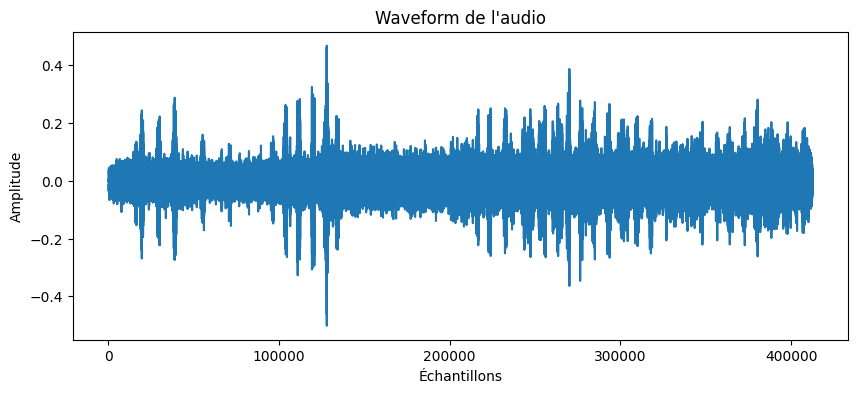

In [8]:
# plot audio waveform for 1 file
plt.figure(figsize=(10, 4))
plt.plot(y)
plt.title("Waveform de l'audio")
plt.xlabel("Échantillons")
plt.ylabel("Amplitude")
plt.show()

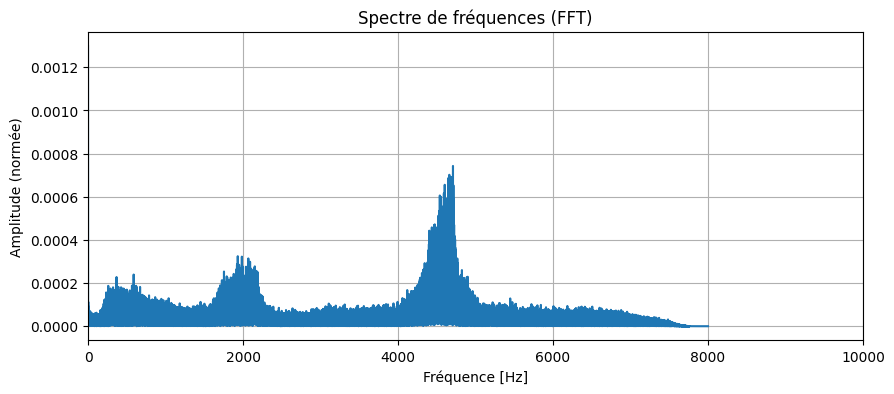

In [9]:
# on plot le spectrogramme for 1 file
#spectre sans yamnet avec fourrier
# Calcul de la FFT (transformée de Fourier)
Y = np.fft.fft(y)
# Nombre d'échantillons
N = len(Y)
# On ne garde que la moitié positive (symétrie du spectre)
Y = Y[:N//2]
# Axe des fréquences
freqs = np.fft.fftfreq(N, d=1/sr)[:N//2]
# Amplitude (modulus)
amplitude = np.abs(Y) / N
plt.figure(figsize=(10, 4))
plt.plot(freqs, amplitude)
plt.title("Spectre de fréquences (FFT)")
plt.xlabel("Fréquence [Hz]")
plt.ylabel("Amplitude (normée)")
plt.xlim(0, 10000)  # par ex. 0–10 kHz pour les oiseaux
plt.grid(True)
plt.show()



Analyse du spectre pour #eubeat1 → XC116937.wav


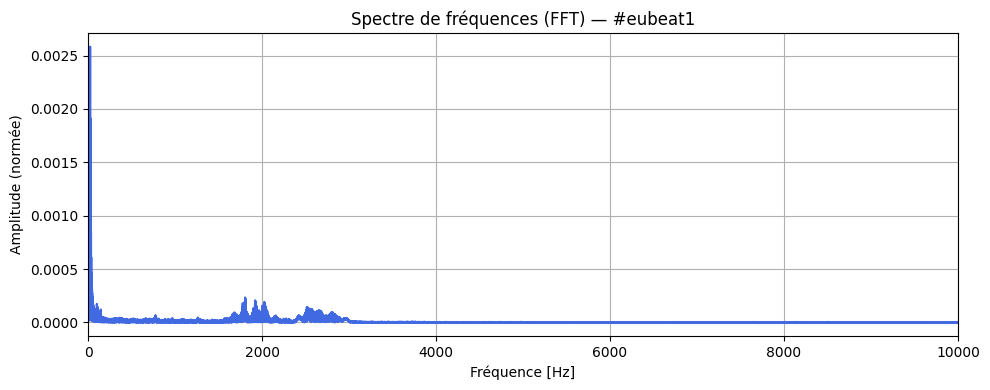


Analyse du spectre pour barswa → XC113914.wav


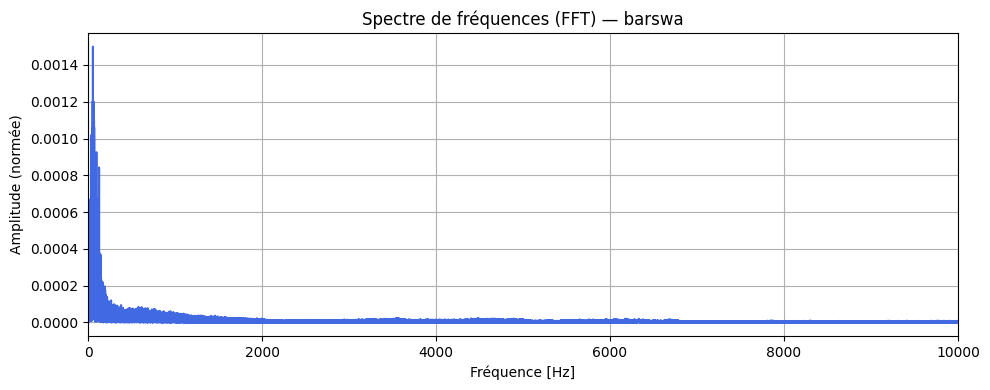


Analyse du spectre pour combuz1 → XC112692.wav


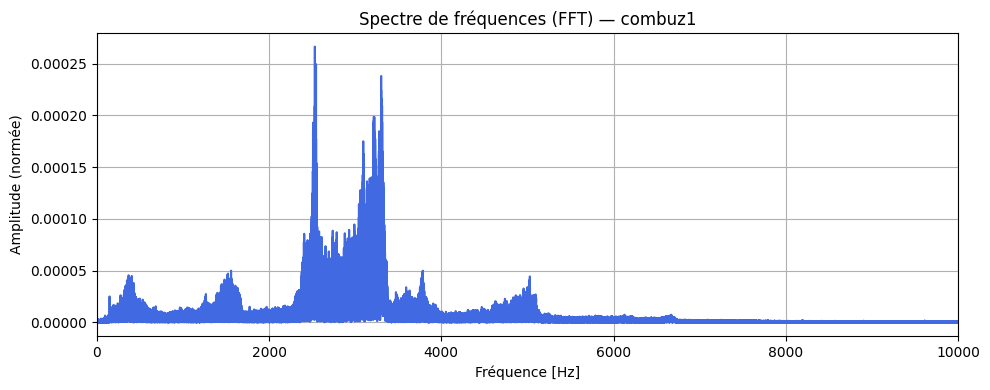


Analyse du spectre pour comsan → XC113844.wav


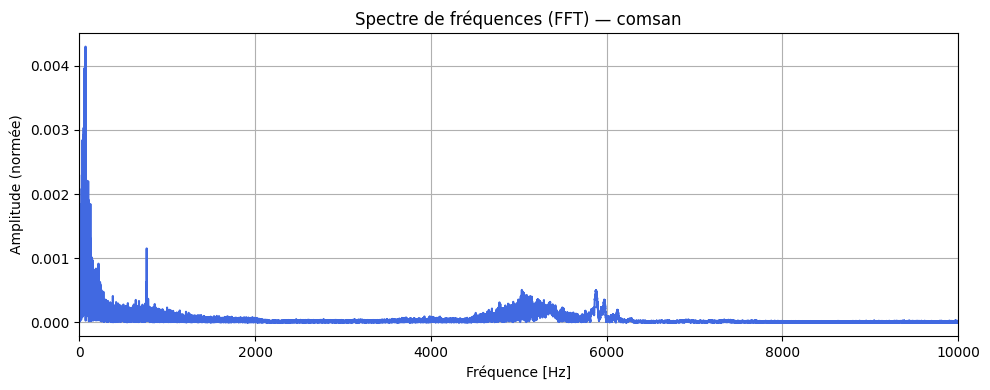


Analyse du spectre pour eaywag1 → XC118267.wav


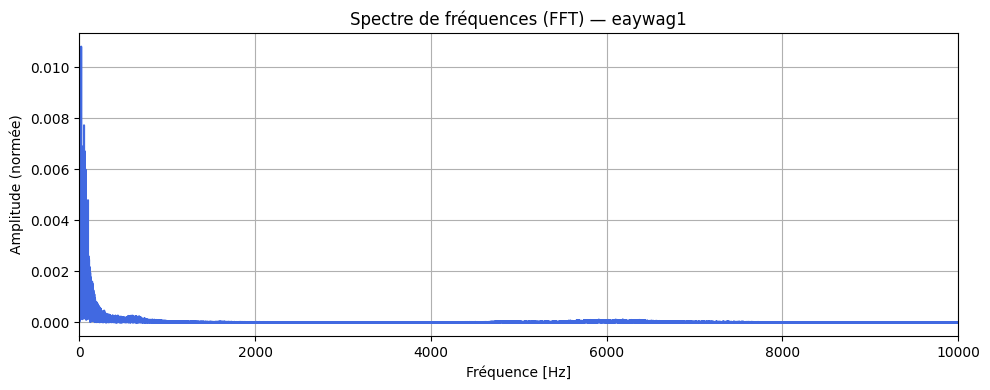


Analyse du spectre pour hoopoe → XC108366.wav


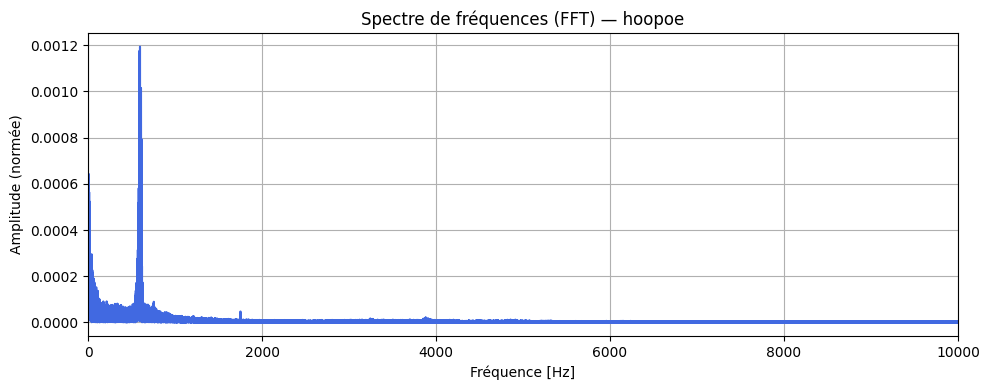


Analyse du spectre pour litegr → XC138320.wav


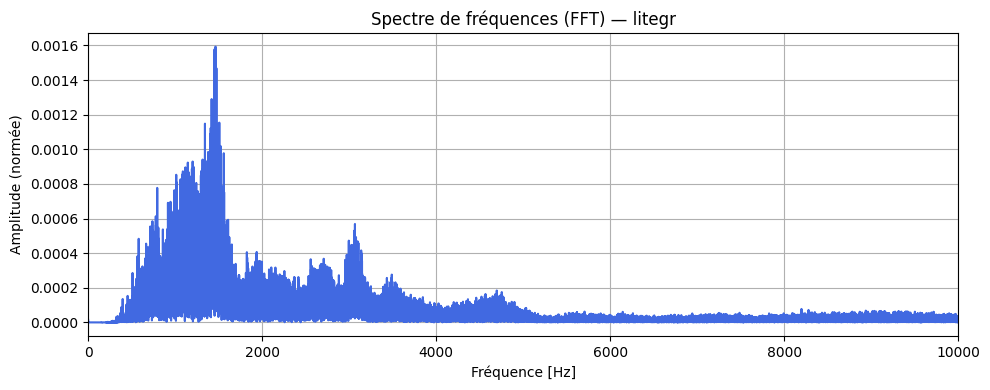


Analyse du spectre pour thrnig1 → XC110335.wav


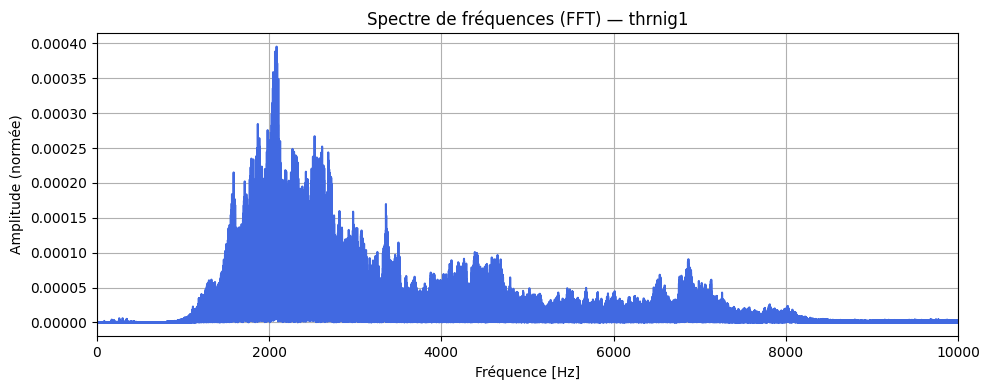


Analyse du spectre pour wlwwar → XC112689.wav


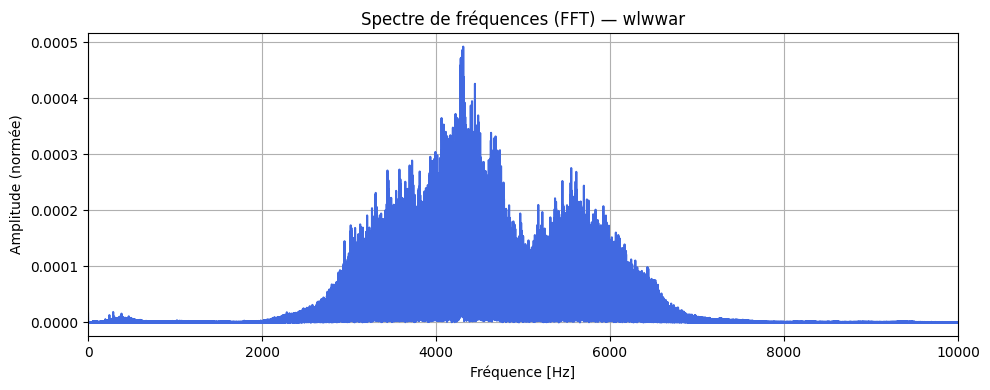


Analyse du spectre pour woosan → XC110316.wav


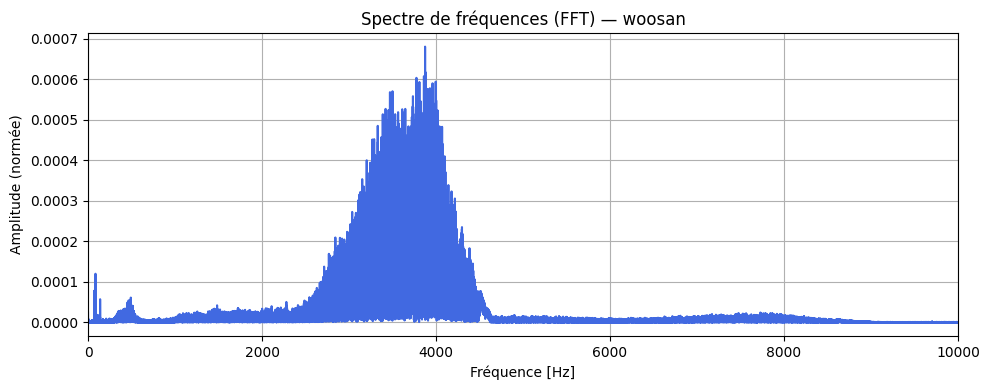

In [10]:
# Dossier racine
base_dir = "dataset/processed_bird_songs"

# Liste des sous-dossiers (espèces)
species_dirs = sorted([d for d in glob.glob(os.path.join(base_dir, "*")) if os.path.isdir(d)])

# Itération sur chaque espèce
for sp_dir in species_dirs:
    species = os.path.basename(sp_dir)

    # Récupérer le premier fichier .wav du dossier
    wavs = sorted(glob.glob(os.path.join(sp_dir, "*.wav")))
    if len(wavs) == 0:
        print(f"[WARN] Aucun fichier trouvé pour {species}")
        continue

    first_file = wavs[0]
    print(f"\nAnalyse du spectre pour {species} → {os.path.basename(first_file)}")

    # Lecture audio
    y, sr = librosa.load(first_file, sr=None, mono=True)

    # FFT
    Y = np.fft.fft(y)
    N = len(Y)
    Y = Y[:N // 2]
    freqs = np.fft.fftfreq(N, d=1 / sr)[:N // 2]
    amplitude = np.abs(Y) / N

    # Plot
    plt.figure(figsize=(10, 4))
    plt.plot(freqs, amplitude, color='royalblue')
    plt.title(f"Spectre de fréquences (FFT) — {species}")
    plt.xlabel("Fréquence [Hz]")
    plt.ylabel("Amplitude (normée)")
    plt.xlim(0, 10000)  # plage utile pour les oiseaux
    plt.grid(True)
    plt.tight_layout()
    plt.show()



Analyse du spectrogramme (filtré) pour #eubeat1 → XC116937.wav


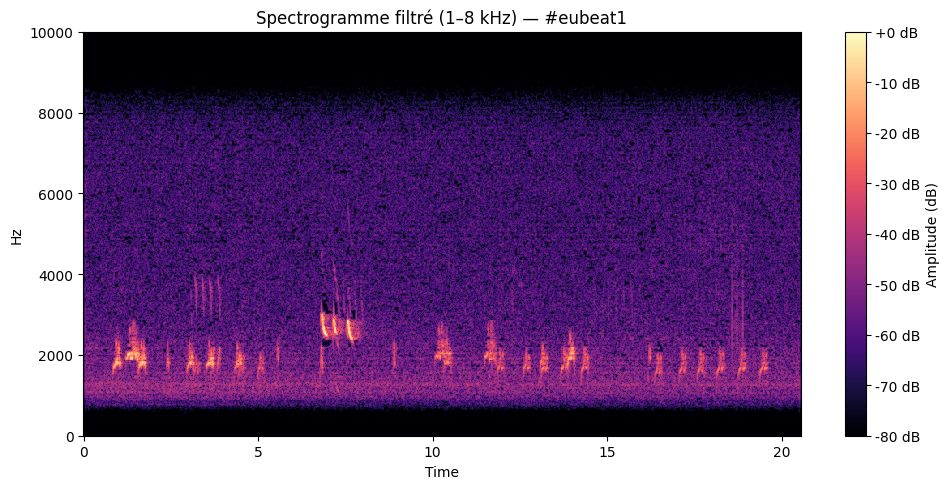


Analyse du spectrogramme (filtré) pour barswa → XC113914.wav


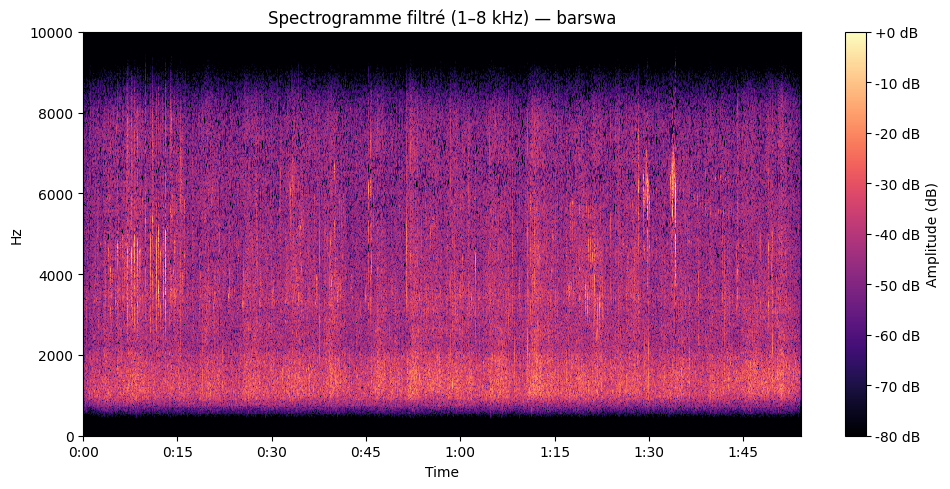


Analyse du spectrogramme (filtré) pour combuz1 → XC112692.wav


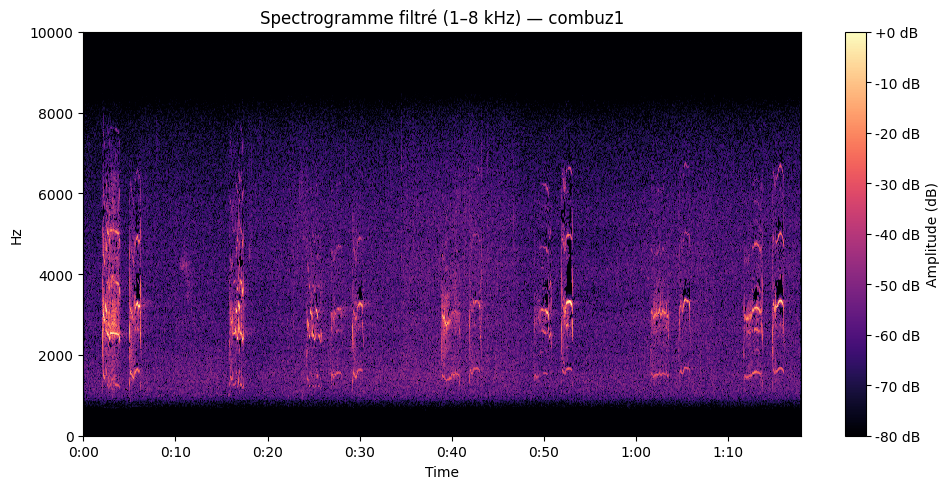


Analyse du spectrogramme (filtré) pour comsan → XC113844.wav


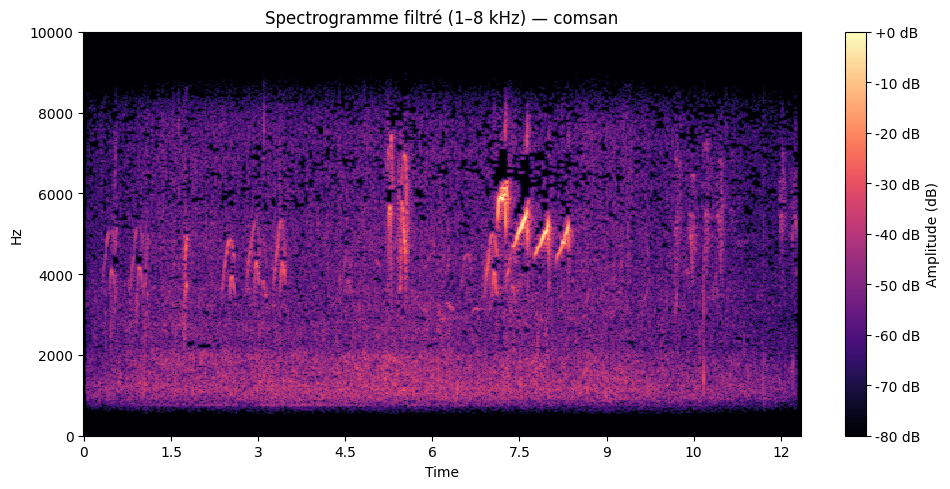


Analyse du spectrogramme (filtré) pour eaywag1 → XC118267.wav


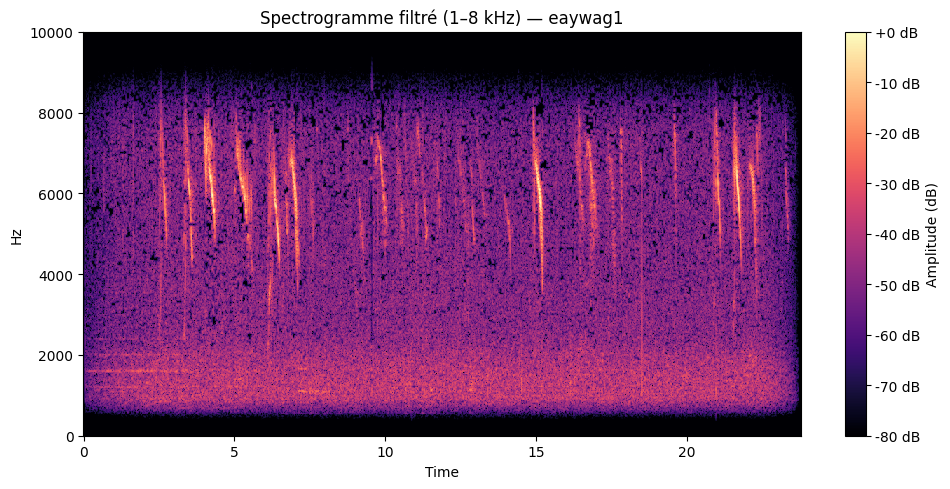


Analyse du spectrogramme (filtré) pour hoopoe → XC108366.wav


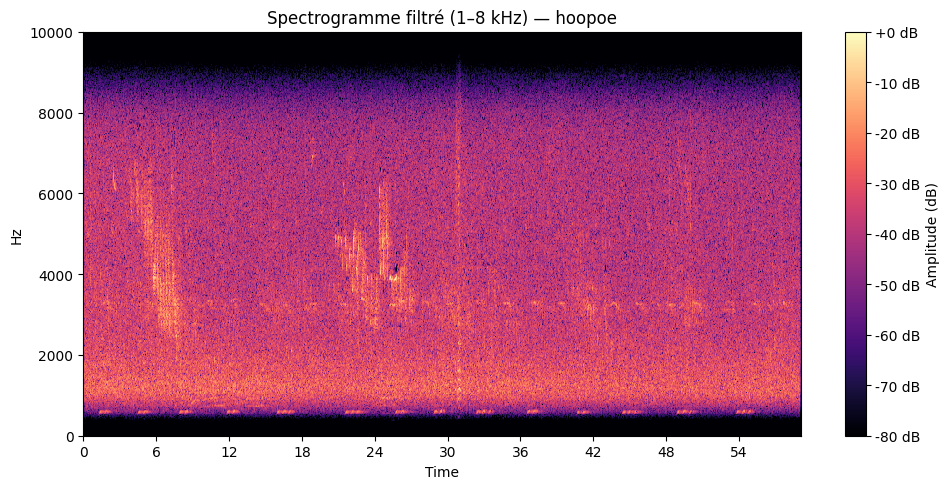


Analyse du spectrogramme (filtré) pour litegr → XC138320.wav


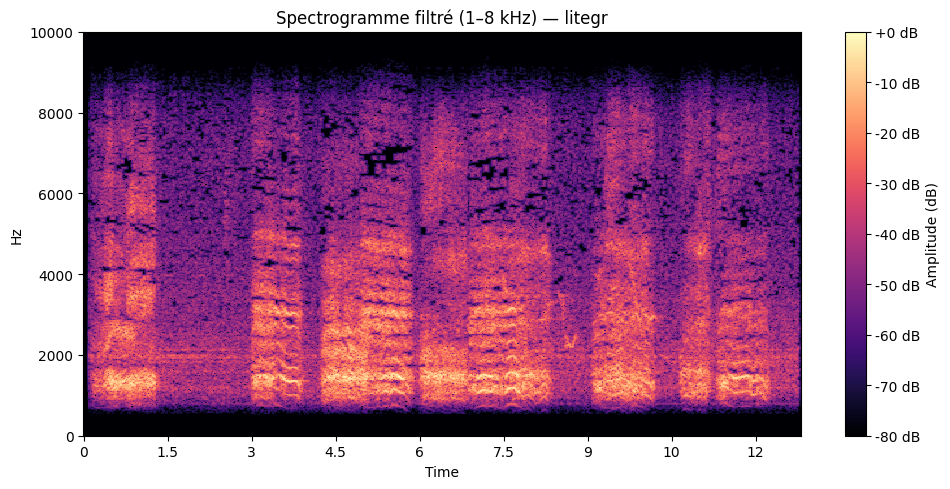


Analyse du spectrogramme (filtré) pour thrnig1 → XC110335.wav


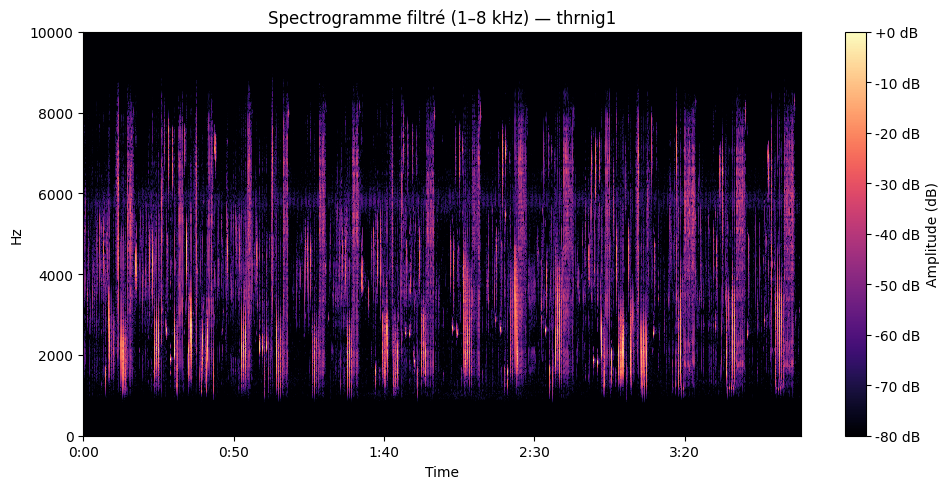


Analyse du spectrogramme (filtré) pour wlwwar → XC112689.wav


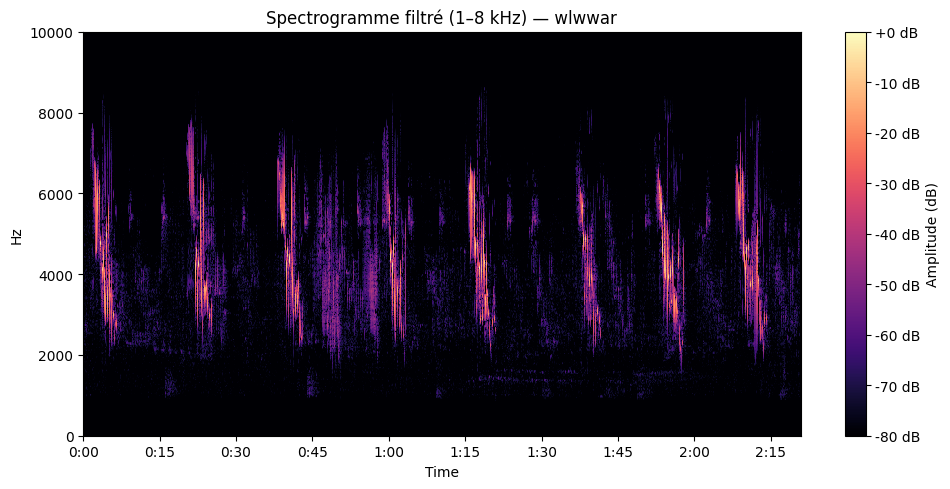


Analyse du spectrogramme (filtré) pour woosan → XC110316.wav


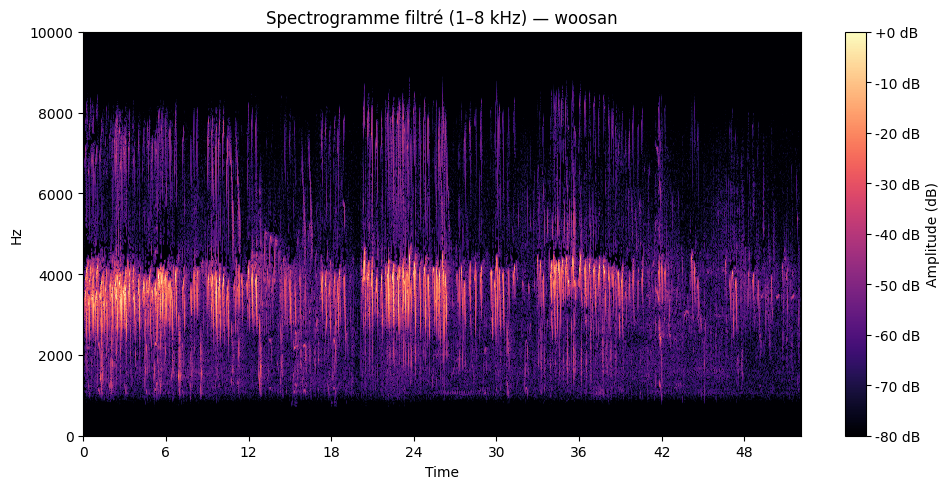

In [13]:
import os
import glob
import numpy as np
import librosa
import librosa.display
import matplotlib.pyplot as plt
from scipy.signal import butter, filtfilt

# ====================================
# 1. Fonction de filtrage passe-bande
# ====================================
def bandpass_waveform(y, sr, f_low=1000, f_high=8000, order=4):
    """Filtre passe-bande Butterworth appliqué sur tout le signal."""
    b, a = butter(order, [f_low/(sr/2), f_high/(sr/2)], btype='band')
    return filtfilt(b, a, y)

# ====================================
# 2. Dossier racine contenant les espèces
# ====================================
base_dir = "dataset/processed_bird_songs"
species_dirs = sorted([d for d in glob.glob(os.path.join(base_dir, "*")) if os.path.isdir(d)])

# ====================================
# 3. Boucle principale
# ====================================
for sp_dir in species_dirs:
    species = os.path.basename(sp_dir)
    wavs = sorted(glob.glob(os.path.join(sp_dir, "*.wav")))
    if len(wavs) == 0:
        print(f"[WARN] Aucun fichier trouvé pour {species}")
        continue

    first_file = wavs[0]
    print(f"\nAnalyse du spectrogramme (filtré) pour {species} → {os.path.basename(first_file)}")

    # Lecture de l’audio
    y, sr = librosa.load(first_file, sr=None, mono=True)

    # =============================
    # 4. Application du filtre passe-bande global
    # =============================
    y_filt = bandpass_waveform(y, sr, f_low=1000, f_high=8000)

    # =============================
    # 5. Calcul du spectrogramme STFT
    # =============================
    n_fft = 1024
    hop_length = 256
    D = np.abs(librosa.stft(y_filt, n_fft=n_fft, hop_length=hop_length))
    S_db = librosa.amplitude_to_db(D, ref=np.max)

    # =============================
    # 6. Visualisation
    # =============================
    plt.figure(figsize=(10, 5))
    librosa.display.specshow(
        S_db, sr=sr, x_axis='time', y_axis='hz', cmap='magma'
    )
    plt.title(f"Spectrogramme filtré (1–8 kHz) — {species}")
    plt.ylim(0, 10000)  # affichage jusqu’à 10 kHz pour référence
    plt.colorbar(format="%+2.0f dB", label="Amplitude (dB)")
    plt.tight_layout()
    plt.show()



=== Analyse intra-espèce : #eubeat1 ===
Nombre de fichiers trouvés : 10

→ Fichier 1: XC116937.wav


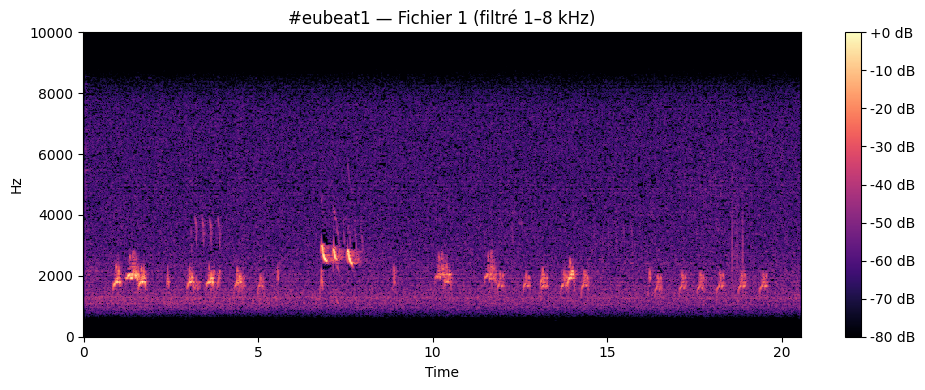


→ Fichier 2: XC116938.wav


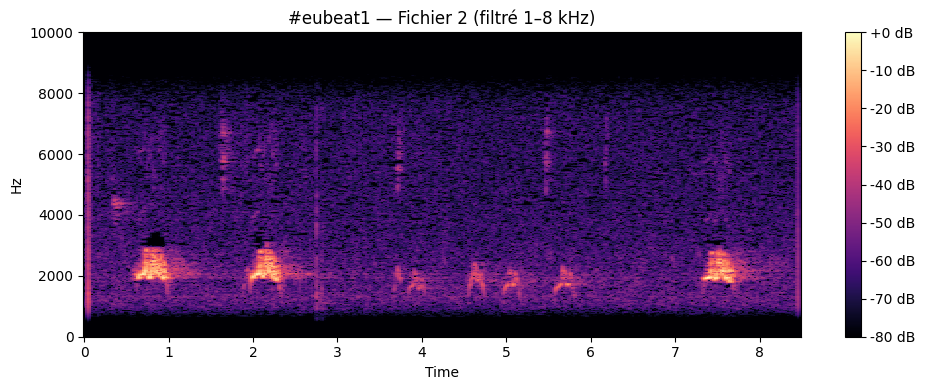


→ Fichier 3: XC125563.wav


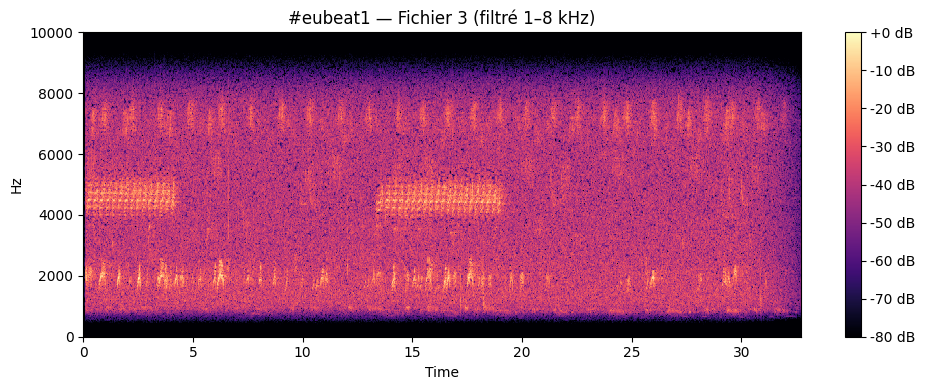


→ Fichier 4: XC126210.wav


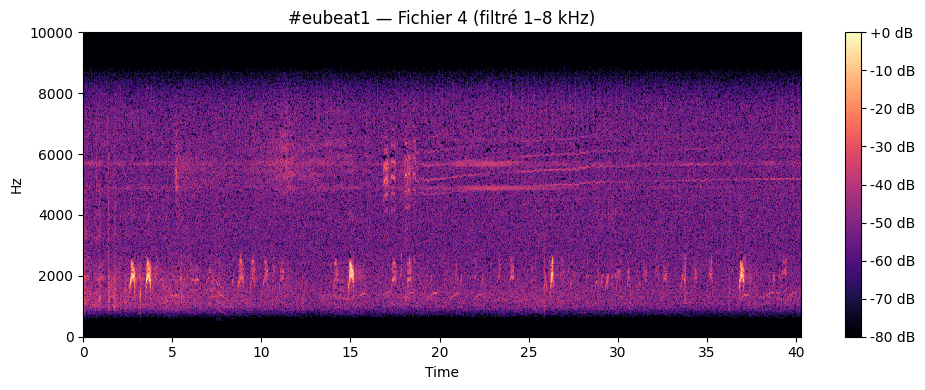


→ Fichier 5: XC126212.wav


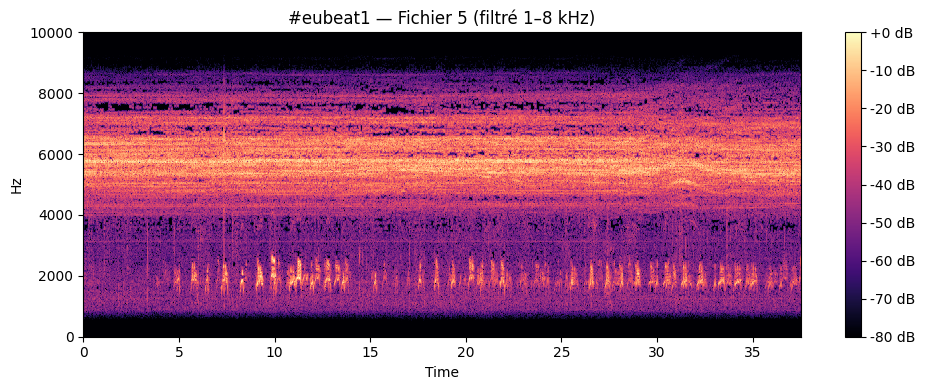


→ Fichier 6: XC126213.wav


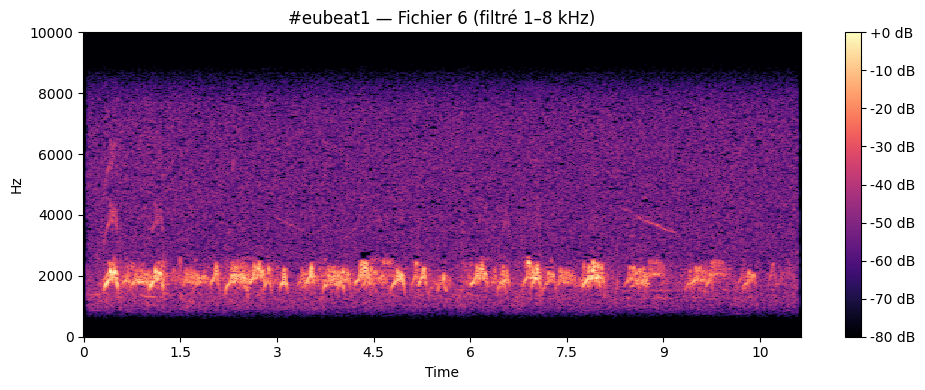


→ Fichier 7: XC126214.wav


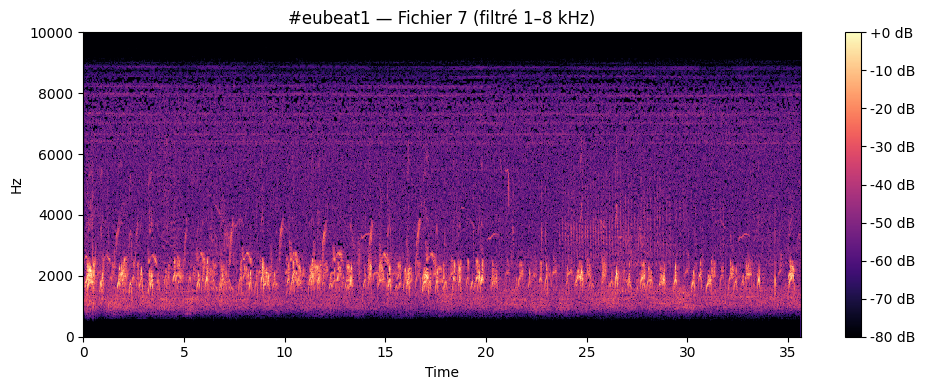


→ Fichier 8: XC134023.wav


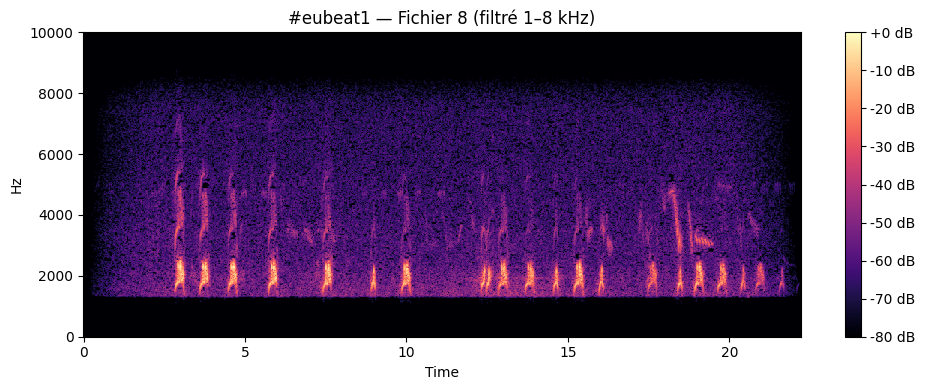


→ Fichier 9: XC134849.wav


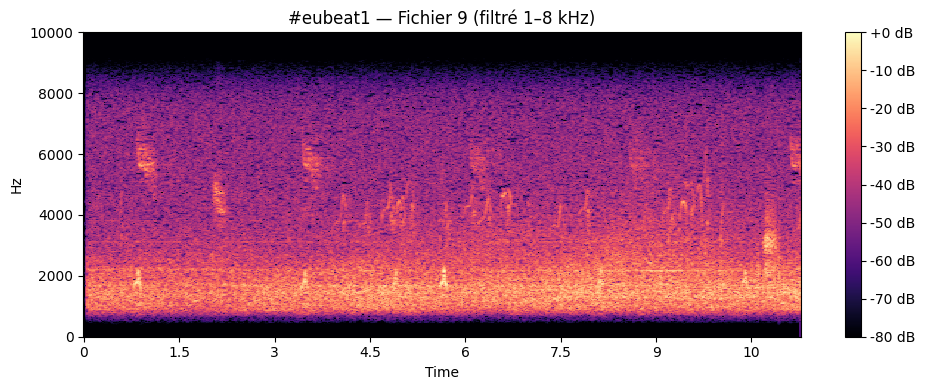


→ Fichier 10: XC135682.wav


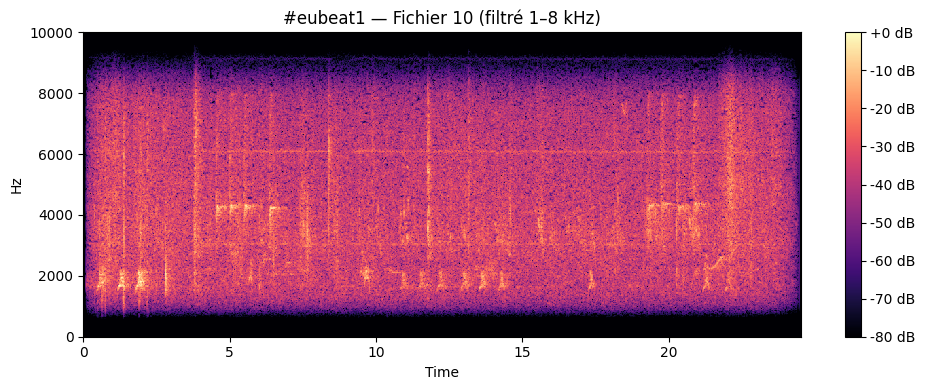

In [20]:
# Prendre la première espèce
first_species_dir = species_dirs[0] #0 arround 2000Hz, 1 very open arround 5000Hz,
species = os.path.basename(first_species_dir)
print(f"\n=== Analyse intra-espèce : {species} ===")

# Charger les 10 premiers fichiers .wav
wavs = sorted(glob.glob(os.path.join(first_species_dir, "*.wav")))[:10]
print(f"Nombre de fichiers trouvés : {len(wavs)}")

# ====================================
# 3. Boucle sur les fichiers
# ====================================
for idx, wav_path in enumerate(wavs, start=1):
    print(f"\n→ Fichier {idx}: {os.path.basename(wav_path)}")

    # Lecture audio
    y, sr = librosa.load(wav_path, sr=None, mono=True)

    # =============================
    # 4. Application du filtre passe-bande global
    # =============================
    y_filt = bandpass_waveform(y, sr, f_low=1000, f_high=8000)

    # =============================
    # 5. Calcul du spectrogramme STFT
    # =============================
    n_fft = 1024
    hop_length = 256
    D = np.abs(librosa.stft(y_filt, n_fft=n_fft, hop_length=hop_length))
    S_db = librosa.amplitude_to_db(D, ref=np.max)

    # =============================
    # 6. Visualisation
    # =============================
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(
        S_db, sr=sr, x_axis='time', y_axis='hz', cmap='magma'
    )
    plt.title(f"{species} — Fichier {idx} (filtré 1–8 kHz)")
    plt.ylim(0, 10000)
    plt.colorbar(format="%+2.0f dB")
    plt.tight_layout()
    plt.show()


## Clustering des embedding avec projections

In [ ]:
import os, glob
import numpy as np
import librosa
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, silhouette_score
from sklearn.metrics.pairwise import cosine_distances

# ===========================================
# 1️⃣ CHARGEMENT / EXTRACTION DES EMBEDDINGS
# ===========================================
base_dir = "dataset/processed_bird_songs"
yamnet_model = hub.load("yamnet_model/")

def extract_embedding(wav_path):
    """Extrait un embedding YAMNet moyen pour un fichier audio .wav"""
    y, sr = librosa.load(wav_path, sr=16000, mono=True)
    waveform = tf.convert_to_tensor(y, dtype=tf.float32)
    scores, embeddings, spectrogram = yamnet_model(waveform)
    emb_mean = tf.reduce_mean(embeddings, axis=0).numpy()
    return emb_mean

species_dirs = sorted([d for d in glob.glob(os.path.join(base_dir, "*")) if os.path.isdir(d)])

X, y, species_names = [], [], []

for label, sp_dir in enumerate(species_dirs):
    species = os.path.basename(sp_dir)
    wavs = sorted(glob.glob(os.path.join(sp_dir, "*.wav")))[:10]  # 10 fichiers / classe
    species_names.append(species)

    for w in wavs:
        emb_path = w.replace(".wav", "_embedding.npy")
        if not os.path.exists(emb_path):
            emb = extract_embedding(w)
            np.save(emb_path, emb)
            print(f"✅ Embedding sauvegardé : {emb_path}")
        else:
            emb = np.load(emb_path)
        X.append(emb)
        y.append(label)

X, y = np.array(X), np.array(y)
print(f"\n[INFO] Total embeddings: {X.shape}, classes: {len(species_names)}")

# ===========================================
# 2️⃣ VISUALISATION PCA
# ===========================================
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

plt.figure(figsize=(8,6))
colors = plt.cm.tab10(np.linspace(0, 1, len(species_names)))
for i, sp in enumerate(species_names):
    plt.scatter(X_pca[y==i,0], X_pca[y==i,1], color=colors[i], label=sp, alpha=0.8)
plt.legend()
plt.title("PCA des embeddings YAMNet")
plt.xlabel("PC1"); plt.ylabel("PC2")
plt.tight_layout()
plt.show()

# ===========================================
# 3️⃣ LDA : projection discriminante
# ===========================================
lda = LinearDiscriminantAnalysis()
X_lda = lda.fit_transform(X, y)

plt.figure(figsize=(8,6))
for i, sp in enumerate(species_names):
    plt.scatter(X_lda[y==i,0], X_lda[y==i,1], color=colors[i], label=sp, alpha=0.8)
plt.legend()
plt.title("Projection LDA (meilleure séparation inter-classes)")
plt.xlabel("LD1"); plt.ylabel("LD2")
plt.tight_layout()
plt.show()

# ===========================================
# 4️⃣ SVM multi-classe
# ===========================================
svm = SVC(kernel='rbf', probability=True, gamma='scale')
svm.fit(X, y)
y_pred = svm.predict(X)
acc = accuracy_score(y, y_pred)
print(f"[SVM] Training accuracy: {acc:.3f}")

# ===========================================
# 5️⃣ DÉTECTION DES SONS INCONNUS (open-set)
# ===========================================
# Seuil basé sur la confiance (proba max < τ)
probs = svm.predict_proba(X)
conf = np.max(probs, axis=1)
unknown_mask = conf < 0.5  # seuil de rejet
print(f"[Open-set] {unknown_mask.sum()} sons rejetés sur {len(conf)} (conf < 0.5)")

# Visualisation dans PCA space
plt.figure(figsize=(8,6))
for i, sp in enumerate(species_names):
    plt.scatter(X_pca[y==i,0], X_pca[y==i,1], color=colors[i], label=sp, alpha=0.6)
plt.scatter(X_pca[unknown_mask,0], X_pca[unknown_mask,1],
            color='gray', marker='x', label='Inconnus', alpha=0.8)
plt.legend()
plt.title("Détection open-set (basée sur la confiance du SVM)")
plt.xlabel("PC1"); plt.ylabel("PC2")
plt.tight_layout()
plt.show()

# ===========================================
# 6️⃣ ÉVALUATION QUALITATIVE : distances cosinus intra/inter
# ===========================================
centroids = np.array([X[y==c].mean(axis=0) for c in np.unique(y)])
dist_intra = []
dist_inter = []

for c in np.unique(y):
    same = X[y==c]
    d_intra = cosine_distances(same, same).mean()
    d_inter = cosine_distances(same, centroids[np.arange(len(centroids)) != c]).mean()
    dist_intra.append(d_intra)
    dist_inter.append(d_inter)

print("\n=== Distances cosinus moyennes ===")
for i, sp in enumerate(species_names):
    print(f"{sp:10s} | intra={dist_intra[i]:.4f} | inter={dist_inter[i]:.4f}")

sil = silhouette_score(X, y, metric="cosine")
print(f"\n[Silhouette score global (cosine)] = {sil:.3f}")


FileNotFoundError: [Errno 2] No such file or directory: 'dataset/processed_bird_songs/#eubeat1/XC116937_embedding.npy'

## Extract embeddings avec AST: Audio spectrogram transformer

In [2]:
from transformers import ASTFeatureExtractor, ASTModel
import torch, librosa

/automathon/users/mig_user3/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2025-10-18 09:28:00.111219: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-10-18 09:28:00.161819: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI AVX512_BF16 AVX512_FP16 AVX_VNNI AMX_TILE AMX_INT8 AMX_BF16 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-10-18 09:28:01.265661: I tensorflow/core/

In [3]:
# Charger le modèle et le preprocess
feature_extractor = ASTFeatureExtractor.from_pretrained("MIT/ast-finetuned-audioset-10-10-0.4593")
model = ASTModel.from_pretrained("MIT/ast-finetuned-audioset-10-10-0.4593")

In [4]:
# Charger un audio (résamplé à 16 kHz)
y, sr = librosa.load("dataset/processed_bird_songs/#eubeat1/XC54954.wav", sr=16000)
y1, sr1 = librosa.load("dataset/processed_bird_songs/#eubeat1/XC56698.wav", sr=16000)
y_diff, sr_diff = librosa.load("dataset/processed_bird_songs/barswa/XC46803.wav", sr=16000)



inputs = feature_extractor(y, sampling_rate=sr, return_tensors="pt")
inputs1 = feature_extractor(y1, sampling_rate=sr, return_tensors="pt")
inputs1 = feature_extractor(y1, sampling_rate=sr, return_tensors="pt")
inputs_diff= feature_extractor(y_diff, sampling_rate=sr_diff, return_tensors="pt")

In [5]:
# Passer dans le modèle
with torch.no_grad():
    outputs = model(**inputs)
    outputs1 = model(**inputs1)
    outputs_diff = model(**inputs_diff)
    
embeddings = outputs.last_hidden_state.mean(dim=1)  # (1, hidden_dim)
embeddings1 = outputs1.last_hidden_state.mean(dim=1)  # (1, hidden_dim)
embeddings_diff = outputs_diff.last_hidden_state.mean(dim=1)
print("Embedding:", embeddings.shape)


Embedding: torch.Size([1, 768])


In [6]:
outputs.last_hidden_state.shape

torch.Size([1, 1214, 768])

In [7]:
print(torch.cosine_similarity(embeddings, embeddings1))

tensor([0.9330])


In [8]:
print(torch.cosine_similarity(embeddings1, embeddings_diff))

tensor([0.7949])


In [19]:
from transformers import ASTForAudioClassification
from torch import nn
from torch.utils.data import Dataset, DataLoader
import torch

feature_extractor = ASTFeatureExtractor.from_pretrained("MIT/ast-finetuned-audioset-10-10-0.4593")
# Charger le modèle complet
model_multi = ASTForAudioClassification.from_pretrained(
    "MIT/ast-finetuned-audioset-10-10-0.4593",
    num_labels=11,  # 10 espèces + 1 noise
    ignore_mismatched_sizes=True
)
model_test10 = ASTForAudioClassification.from_pretrained(
    "MIT/ast-finetuned-audioset-10-10-0.4593",
    num_labels=10,  # 10 espèces
    ignore_mismatched_sizes=True
)
model_binary = ASTForAudioClassification.from_pretrained(
    "MIT/ast-finetuned-audioset-10-10-0.4593",
    num_labels=2,  # guepard vs non-guepard
    ignore_mismatched_sizes=True
)


Some weights of ASTForAudioClassification were not initialized from the model checkpoint at MIT/ast-finetuned-audioset-10-10-0.4593 and are newly initialized because the shapes did not match:
- classifier.dense.bias: found shape torch.Size([527]) in the checkpoint and torch.Size([11]) in the model instantiated
- classifier.dense.weight: found shape torch.Size([527, 768]) in the checkpoint and torch.Size([11, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of ASTForAudioClassification were not initialized from the model checkpoint at MIT/ast-finetuned-audioset-10-10-0.4593 and are newly initialized because the shapes did not match:
- classifier.dense.bias: found shape torch.Size([527]) in the checkpoint and torch.Size([10]) in the model instantiated
- classifier.dense.weight: found shape torch.Size([527, 768]) in the checkpoint and torch.Size([10, 768]) in the model instantiated
Y

In [10]:
# Préparer ton dataset (classes = sous-dossiers)
class BirdDataset(Dataset):
    def __init__(self, base_dir, feature_extractor):
        import glob, os
        self.files, self.labels, self.classes = [], [], []
        self.classes = sorted([d for d in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir, d))])
        for i, c in enumerate(self.classes):
            for f in glob.glob(os.path.join(base_dir, c, "*.wav")):
                self.files.append(f)
                self.labels.append(i)
        self.extractor = feature_extractor

    def __getitem__(self, idx):
        y, sr = librosa.load(self.files[idx], sr=16000)
        inp = self.extractor(y, sampling_rate=sr, return_tensors="pt", truncation=True, padding="max_length", max_length=16000)
        inp = {k: v.squeeze(0) for k, v in inp.items()}
        return inp, torch.tensor(self.labels[idx])

    def __len__(self): return len(self.files)


In [11]:

dataset = BirdDataset("dataset/processed_bird_songs", feature_extractor)
dataloader = DataLoader(dataset, batch_size=4, shuffle=True)


In [12]:
# Entraînement simple
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

Using device: cpu


In [14]:
import torch
print("GPU disponible :", torch.cuda.is_available())
print("Nom GPU :", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "CPU only")


GPU disponible : False
Nom GPU : CPU only


In [25]:
model_test10

ASTForAudioClassification(
  (audio_spectrogram_transformer): ASTModel(
    (embeddings): ASTEmbeddings(
      (patch_embeddings): ASTPatchEmbeddings(
        (projection): Conv2d(1, 768, kernel_size=(16, 16), stride=(10, 10))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ASTEncoder(
      (layer): ModuleList(
        (0-11): 12 x ASTLayer(
          (attention): ASTAttention(
            (attention): ASTSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
            )
            (output): ASTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ASTIntermediate(
            (dense): Linear(in_features=768, out_features=3072, bias=T

In [20]:
# Optimizer
optimizer = torch.optim.AdamW(model_test10.parameters(), lr=1e-5)


model_test10.to(device)
model_test10.train()

ASTForAudioClassification(
  (audio_spectrogram_transformer): ASTModel(
    (embeddings): ASTEmbeddings(
      (patch_embeddings): ASTPatchEmbeddings(
        (projection): Conv2d(1, 768, kernel_size=(16, 16), stride=(10, 10))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ASTEncoder(
      (layer): ModuleList(
        (0-11): 12 x ASTLayer(
          (attention): ASTAttention(
            (attention): ASTSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
            )
            (output): ASTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ASTIntermediate(
            (dense): Linear(in_features=768, out_features=3072, bias=T

### Approach 1: finetune embeddings + classes head (actviate or not embeddings layers)

In [37]:
# 1️⃣ Geler tout le backbone
for param in model_test10.audio_spectrogram_transformer.parameters():
    param.requires_grad = False

#Si on veut entrainer aussi last layer des embeddings:
# Dé-geler les 2 dernières couches Transformer du backbone
for name, param in model_test10.named_parameters():
    # if "encoder.layer.10" in name or "encoder.layer.11" in name:
    if "encoder.layer.11" in name:
        param.requires_grad = True
    else:
        param.requires_grad = False
# 2️⃣ S’assurer que la tête (classifier) reste entraînable
for param in model_test10.classifier.parameters():
    param.requires_grad = True

# 3️⃣ Vérifier le nombre de paramètres entraînables
trainable = sum(p.numel() for p in model_test10.parameters() if p.requires_grad)
print(f"Nombre de paramètres entraînables : {trainable:,}")


Nombre de paramètres entraînables : 7,097,098


In [ ]:
for epoch in range(3):
    total_loss = 0
    for batch, labels in dataloader:
        batch = {k: v.to(device) for k, v in batch.items()}
        labels = labels.to(device)
        out = model_test10(**batch, labels=labels)
        # print("out:", out)
        loss = out.loss
        # print("loss:", loss.item())
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    print(f"Epoch {epoch+1}, loss={total_loss/len(dataloader):.4f}")

### Approach 2: Supervised tuning des embeddings

In [45]:
import torch.nn.functional as F
from transformers import ASTModel, ASTFeatureExtractor
import librosa, os, glob, random

In [38]:
class ASTEmbeddingModel(nn.Module):
    def __init__(self, proj_dim=128, freeze_until_layer=9):
        super().__init__()
        self.backbone = ASTModel.from_pretrained(
            "MIT/ast-finetuned-audioset-10-10-0.4593"
        )
        # Geler les couches inférieures
        for name, p in self.backbone.named_parameters():
            p.requires_grad = False
            if f"encoder.layer.{freeze_until_layer}" in name:
                break

        self.proj = nn.Sequential(
            nn.Linear(768, proj_dim),
            nn.ReLU(),
            nn.Linear(proj_dim, proj_dim)
        )

    def forward(self, input_values, attention_mask=None):
        out = self.backbone(input_values=input_values, attention_mask=attention_mask, return_dict=True)
        h = out.last_hidden_state.mean(dim=1)   # pooling temporel
        z = self.proj(h)
        z = F.normalize(z, p=2, dim=1)          # L2-normalisé
        return z


In [39]:
def lda_cosine_loss(embeddings, labels, eps=1e-6):
    """
    embeddings: (B, D) normalisés L2
    labels: (B,)
    """
    cos = embeddings @ embeddings.T  # (B, B)
    B = embeddings.size(0)
    lbl = labels.view(-1,1)
    mask_same = (lbl == lbl.T).float()
    mask_diff = 1 - mask_same

    # on retire les diagonales (self-sim)
    mask_same.fill_diagonal_(0)

    sim_intra = (cos * mask_same).sum() / (mask_same.sum() + eps)
    sim_inter = (cos * mask_diff).sum() / (mask_diff.sum() + eps)

    ratio = (sim_intra + eps) / (sim_inter + eps)
    loss = torch.log(ratio)
    return loss, sim_intra.item(), sim_inter.item()


In [47]:
def supervised_contrastive_loss(embeddings, labels, temperature=0.07):
    """
    embeddings: (B, D), L2-normalisés
    labels: (B,)
    """
    device = embeddings.device
    B = embeddings.shape[0]
    sim = torch.matmul(embeddings, embeddings.T) / temperature  # (B, B)
    sim_max, _ = torch.max(sim, dim=1, keepdim=True)
    sim = sim - sim_max.detach()  # stabilité numérique

    labels = labels.contiguous().view(-1, 1)
    mask = torch.eq(labels, labels.T).float().to(device)

    # log-probabilités
    exp_sim = torch.exp(sim) * (1 - torch.eye(B, device=device))
    log_prob = sim - torch.log(exp_sim.sum(dim=1, keepdim=True) + 1e-9)

    mean_log_prob_pos = (mask * log_prob).sum(1) / (mask.sum(1) + 1e-9)
    loss = -mean_log_prob_pos.mean()

    return loss


In [41]:
from torch.optim import AdamW

# config
BASE_DIR = "dataset/cleaned_bird_songs"
feature_extractor = ASTFeatureExtractor.from_pretrained("MIT/ast-finetuned-audioset-10-10-0.4593")
dataset = BirdDataset(BASE_DIR, feature_extractor)
dataloader = DataLoader(dataset, batch_size=16, shuffle=True, num_workers=4)


In [42]:
device = "cuda" if torch.cuda.is_available() else "cpu"
model = ASTEmbeddingModel(proj_dim=128, freeze_until_layer=9).to(device)

optimizer = AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=1e-5)


In [ ]:
EPOCHS = 5
for epoch in range(EPOCHS):
    model.train()
    total_loss, intra_vals, inter_vals = 0, [], []
    for batch, labels in dataloader:
        batch = {k: v.to(device) for k,v in batch.items()}
        labels = labels.to(device)
        emb = model(**batch)
        # loss, sim_intra, sim_inter = lda_cosine_loss(emb, labels)
        loss = supervised_contrastive_loss(emb, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        # intra_vals.append(sim_intra)
        # inter_vals.append(sim_inter)
        # print(f"Batch loss={loss.item():.4f} | intra={sim_intra:.3f} | inter={sim_inter:.3f}")
        print(f"Batch loss={loss.item():.4f}")

    print(f"[Epoch {epoch+1}/{EPOCHS}] loss={total_loss/len(dataloader):.4f} | "
        f"intra={np.mean(intra_vals):.3f} | inter={np.mean(inter_vals):.3f}")


In [64]:
import soundfile as sf
import torch
from transformers import ASTFeatureExtractor
import torch.nn.functional as F
import numpy as np
import torchaudio

class BirdDataset(Dataset):
    def __init__(self, base_dir, feature_extractor, max_total_samples=100, sr=16000):
        self.samples = []
        self.labels = []
        self.label_map = {}
        self.sr = sr
        self.feat_ext = feature_extractor

        subdirs = sorted([d for d in glob.glob(os.path.join(base_dir, "*")) if os.path.isdir(d)])
        print(f"[INFO] Found {len(subdirs)} species")

        count = 0
        for label_idx, sp_dir in enumerate(subdirs):
            if count >= max_total_samples:
                break

            species = os.path.basename(sp_dir)
            wavs = sorted(glob.glob(os.path.join(sp_dir, "*.wav")))
            if not wavs:
                continue

            # prendre 10 fichiers par espèce
            max_per_species=10
            n = min(max_per_species, len(wavs), max_total_samples - count)
            selected = random.sample(wavs, n)
            self.label_map[label_idx] = species

            for w in selected:
                self.samples.append(w)
                self.labels.append(label_idx)
                count += 1
                if count >= max_total_samples:
                    break

        print(f"[INFO] Loaded {len(self.samples)} audio files from {len(self.label_map)} species")

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        path = self.samples[idx]
        label = self.labels[idx]

        # ✅ Lecture audio stable avec soundfile
        waveform, sr = sf.read(path, dtype="float32")
        waveform = torch.tensor(waveform)

        # Conversion mono si besoin
        if waveform.ndim > 1:
            waveform = waveform.mean(dim=1)

        # Resample si nécessaire
        if sr != self.sr:
            waveform = torchaudio.functional.resample(waveform, sr, self.sr)

        inputs = self.feat_ext(waveform, sampling_rate=self.sr, return_tensors="pt")
        inputs = {k: v.squeeze(0) for k, v in inputs.items()}
        return inputs, torch.tensor(label)


In [70]:
# ======================
# 2️⃣ Initialisation rapide
# ======================
from transformers import ASTForAudioClassification

base_dir = "dataset/cleaned_bird_songs"
feature_extractor = ASTFeatureExtractor.from_pretrained("MIT/ast-finetuned-audioset-10-10-0.4593")

dataset = BirdDataset(base_dir, feature_extractor, max_total_samples=100)
dataloader = DataLoader(dataset, batch_size=10, shuffle=True)

model = ASTForAudioClassification.from_pretrained(
    "MIT/ast-finetuned-audioset-10-10-0.4593",
    num_labels=len(dataset.label_map),
    ignore_mismatched_sizes=True
)

for param in model.parameters():
    param.requires_grad = False
# Définir le nombre de couches de l'encodeur à finetuner
num_layers_to_unfreeze = 4 # Finetuner les 2 dernières couches (indices 10 et 11)

# Le chemin est model.audio_spectrogram_transformer.encoder.layer
encoder_layers = model.audio_spectrogram_transformer.encoder.layer
num_total_layers = len(encoder_layers) # 12 couches (0 à 11)

# Débloquer les couches [10] et [11] (les 2 dernières)
for i in range(num_total_layers - num_layers_to_unfreeze, num_total_layers): # i = 10 et i = 11
    print(f"Déblocage de la couche ASTLayer n°{i}")
    for param in encoder_layers[i].parameters():
        param.requires_grad = True

# Débloquer le LayerNorm final de l'encodeur (juste avant le head/pooler)
for param in model.audio_spectrogram_transformer.layernorm.parameters():
    param.requires_grad = True


device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)
optimizer = torch.optim.AdamW(
    filter(lambda p: p.requires_grad, model.parameters()), 
    lr=1e-5
)
# ======================
# 3️⃣ Contrastive loss simple
# ======================
import torch.nn.functional as F

def supervised_contrastive_loss(embeddings, labels, temperature=0.07):
    emb = F.normalize(embeddings, dim=1)
    sim_matrix = torch.matmul(emb, emb.T) / temperature
    mask = torch.eq(labels.unsqueeze(1), labels.unsqueeze(0)).float()
    logits_mask = torch.ones_like(mask) - torch.eye(mask.size(0), device=mask.device)
    mask = mask * logits_mask
    exp_sim = torch.exp(sim_matrix) * logits_mask
    log_prob = sim_matrix - torch.log(exp_sim.sum(1, keepdim=True) + 1e-8)
    mean_log_prob_pos = (mask * log_prob).sum(1) / (mask.sum(1) + 1e-8)
    loss = -mean_log_prob_pos.mean()
    return loss


# ======================
# 4️⃣ Boucle d'entraînement courte (ex: 5 epochs)
# ======================
for epoch in range(5):
    model.train()
    total_loss = 0.0
    for batch, labels in dataloader:
        batch = {k: v.to(device) for k, v in batch.items()}
        labels = labels.to(device)

        outputs = model(**batch, output_hidden_states=True)
        embeddings = outputs.hidden_states[-1].mean(dim=1)

        loss = supervised_contrastive_loss(embeddings, labels)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        print(f"Batch loss={loss.item():.4f}")

    print(f"Epoch {epoch+1}/5 | mean_loss={total_loss/len(dataloader):.4f}")


[INFO] Found 10 species
[INFO] Loaded 100 audio files from 10 species


Some weights of ASTForAudioClassification were not initialized from the model checkpoint at MIT/ast-finetuned-audioset-10-10-0.4593 and are newly initialized because the shapes did not match:
- classifier.dense.bias: found shape torch.Size([527]) in the checkpoint and torch.Size([10]) in the model instantiated
- classifier.dense.weight: found shape torch.Size([527, 768]) in the checkpoint and torch.Size([10, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Déblocage de la couche ASTLayer n°8
Déblocage de la couche ASTLayer n°9
Déblocage de la couche ASTLayer n°10
Déblocage de la couche ASTLayer n°11
Batch loss=1.2207
Batch loss=1.5634
Batch loss=1.1978
Batch loss=0.8807
Batch loss=1.3290
Batch loss=1.1421
Batch loss=1.2621
Batch loss=1.3566
Batch loss=1.3773
Batch loss=1.2000
Epoch 1/5 | mean_loss=1.2530
Batch loss=1.0549
Batch loss=1.1232
Batch loss=0.9772
Batch loss=1.0240
Batch loss=1.2484
Batch loss=1.5374
Batch loss=1.0114
Batch loss=0.9453
Batch loss=0.6593
Batch loss=1.2384
Epoch 2/5 | mean_loss=1.0819
Batch loss=0.7802
Batch loss=0.4432
Batch loss=1.2490
Batch loss=1.3907
Batch loss=0.5967
Batch loss=1.4244
Batch loss=1.1516
Batch loss=1.0671
Batch loss=1.3825
Batch loss=1.0841
Epoch 3/5 | mean_loss=1.0569
Batch loss=0.8881
Batch loss=1.1627
Batch loss=0.3330
Batch loss=1.1359
Batch loss=1.5274
Batch loss=0.9208
Batch loss=0.7275
Batch loss=1.2302
Batch loss=1.0162
Batch loss=1.4467
Epoch 4/5 | mean_loss=1.0388
Batch loss=1.8639


In [67]:
model

ASTForAudioClassification(
  (audio_spectrogram_transformer): ASTModel(
    (embeddings): ASTEmbeddings(
      (patch_embeddings): ASTPatchEmbeddings(
        (projection): Conv2d(1, 768, kernel_size=(16, 16), stride=(10, 10))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ASTEncoder(
      (layer): ModuleList(
        (0-11): 12 x ASTLayer(
          (attention): ASTAttention(
            (attention): ASTSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
            )
            (output): ASTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ASTIntermediate(
            (dense): Linear(in_features=768, out_features=3072, bias=T

In [ ]:
checkpoint = torch.load("models/ast_bird_contrastive.pt", map_location=device)
model = ASTForAudioClassification.from_pretrained(
    "MIT/ast-finetuned-audioset-10-10-0.4593",
    num_labels=len(checkpoint["label_map"]),
    ignore_mismatched_sizes=True
)
model.load_state_dict(checkpoint["model_state_dict"])
model.to(device)
model.eval()

feature_extractor = checkpoint["feature_extractor"]
label_map = checkpoint["label_map"]
